# Airbnb Data

## <a id='4'>Setting Up Environment</a>

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Importing the required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import datetime as dt
import matplotlib
from matplotlib.colors import ListedColormap
%matplotlib inline
from scipy import stats
import matplotlib.pyplot as plt
import sys
import plotly as py
import plotly.graph_objs as go
import math
from math import sqrt
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from catboost import CatBoostRegressor
import lightgbm as lgb
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV


# for converting scientific noations such as 1.5643639e+11 to 1564363967221.00
pd.options.display.float_format = '{:.4f}'.format
np.set_printoptions(suppress=True,formatter={'float_kind':'{:f}'.format})

## <a id='4'>Loading the Airbnb Data </a>

In [2]:
# Reading the File from same folder where the Python file is available
airbnbdata = pd.read_csv("C:/Users/KomalShukla/Desktop/MS Analytics/ALY6040_Data Mining/airbnbdata.csv")
airbnb_data = airbnbdata
airbnb_data.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.6475,-73.9724,Private room,149,1,9,2018-10-19,0.2100,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.7536,-73.9838,Entire home/apt,225,1,45,2019-05-21,0.3800,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.8090,-73.9419,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.6851,-73.9598,Entire home/apt,89,1,270,2019-07-05,4.6400,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.7985,-73.9440,Entire home/apt,80,10,9,2018-11-19,0.1000,1,0


## <a id='4'>Understanding the Structure of data</a>

In [3]:
#Shape of the dataframe
print("Size of Airbnb data:","\n No. of Columns:",airbnb_data.shape[1],
      "\n No. of Rows:",airbnb_data.shape[0])

Size of Airbnb data: 
 No. of Columns: 16 
 No. of Rows: 48895


In [4]:
# Summary of the dataframs, like Column names, their data types etc.
airbnb_data.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
# Use the `duplicated()` method to check for duplicate rows.
duplicate_rows = airbnb_data.duplicated()

# Print the number of duplicate rows.
print('Number of duplicate rows:', duplicate_rows.sum())

Number of duplicate rows: 0


In [6]:
# Descriptive Statistics of the datafame

airbnb_data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.0000,48895.0000,48895.0000,48895.0000,48895.0000,48895.0000,48895.0000,38843.0000,48895.0000,48895.0000
mean,19017143.2362,67620010.6466,40.7289,-73.9522,152.7207,7.0300,23.2745,1.3732,7.1440,112.7813
std,10983108.3856,78610967.0327,0.0545,0.0462,240.1542,20.5105,44.5506,1.6804,32.9525,131.6223
min,2539.0000,2438.0000,40.4998,-74.2444,0.0000,1.0000,0.0000,0.0100,1.0000,0.0000
25%,9471945.0000,7822033.0000,40.6901,-73.9831,69.0000,1.0000,1.0000,0.1900,1.0000,0.0000
50%,19677284.0000,30793816.0000,40.7231,-73.9557,106.0000,3.0000,5.0000,0.7200,1.0000,45.0000
75%,29152178.5000,107434423.0000,40.7631,-73.9363,175.0000,5.0000,24.0000,2.0200,2.0000,227.0000
max,36487245.0000,274321313.0000,40.9131,-73.7130,10000.0000,1250.0000,629.0000,58.5000,327.0000,365.0000


In [7]:
# Checking the columns names

airbnb_data.columns.tolist()

['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

In [8]:
# Checking for numerical and Categorical variable in the dataframe 

categorical_columns = airbnb_data.select_dtypes(exclude = [np.number])
numeric_columns = airbnb_data.select_dtypes(include = [np.number])

print('There are {0} categorical and {1} numerical variables in the data set'.\
     format(categorical_columns.shape[1], numeric_columns.shape[1]))

There are 6 categorical and 10 numerical variables in the data set


In [9]:
# checking for missing values

missing_val_airbnb = (airbnb_data.isnull().sum().sort_values(ascending = False))
missing_val_airbnb 

last_review                       10052
reviews_per_month                 10052
host_name                            21
name                                 16
id                                    0
host_id                               0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

##### Here we observed that missing values are in column "last_review", "reviews_per_month", "host_name" and "name"

##### Let us review missing columns individually, and treat them

In [10]:
# last_review Columns
airbnb_data['last_review']

0        2018-10-19
1        2019-05-21
2               NaN
3        2019-07-05
4        2018-11-19
            ...    
48890           NaN
48891           NaN
48892           NaN
48893           NaN
48894           NaN
Name: last_review, Length: 48895, dtype: object

Here we can observe that the last_review has only dates or missing values, hence we can drop this column

In [11]:
# host_name Columns
airbnb_data['host_name']

0                 John
1             Jennifer
2            Elisabeth
3          LisaRoxanne
4                Laura
             ...      
48890          Sabrina
48891          Marisol
48892    Ilgar & Aysel
48893              Taz
48894       Christophe
Name: host_name, Length: 48895, dtype: object

Here we can observe that the host_name has names of the host, which will is not an important part of analysis hence we can drop this column

In [12]:
# name Columns
airbnb_data['name']

0                       Clean & quiet apt home by the park
1                                    Skylit Midtown Castle
2                      THE VILLAGE OF HARLEM....NEW YORK !
3                          Cozy Entire Floor of Brownstone
4         Entire Apt: Spacious Studio/Loft by central park
                               ...                        
48890      Charming one bedroom - newly renovated rowhouse
48891        Affordable room in Bushwick/East Williamsburg
48892              Sunny Studio at Historical Neighborhood
48893                 43rd St. Time Square-cozy single bed
48894    Trendy duplex in the very heart of Hell's Kitchen
Name: name, Length: 48895, dtype: object

Here we can observe that the name column has listing Name which will is not an important part of analysis hence we can drop this column too.

In [13]:
# dropping 3 of the 4 columns which has missing values 

airbnb_data.drop(["name","host_name","last_review"], axis=1, inplace=True)

In [14]:
# checking missing values of colummn reviews_per_month
airbnb_data["reviews_per_month"]

0       0.2100
1       0.3800
2          NaN
3       4.6400
4       0.1000
         ...  
48890      NaN
48891      NaN
48892      NaN
48893      NaN
48894      NaN
Name: reviews_per_month, Length: 48895, dtype: float64

##### Based on the dataset, it appears that the 'reviews_per_month' column represents the rating of the Airbnb listings. Since there are missing values in this column, it is reasonable to assume that these missing values correspond to listings that have not received any reviews yet. Therefore, we can impute 0 in place of the missing values, indicating that these listings have not received any reviews.

In [15]:
# Impute missing values in the 'reviews_per_month' column with 0
airbnb_data.fillna({'reviews_per_month': 0}, inplace=True)

# Check if there are any remaining missing values in the dataset
print(airbnb_data.isnull().sum())

id                                0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64


##### We can also drop column "id" for our analysis

In [16]:
# dropping "id" column
airbnb_data.drop(["id"], axis=1, inplace=True)

# Dataset for EDA
airbnb_data.head(5)

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.6475,-73.9724,Private room,149,1,9,0.2100,6,365
1,2845,Manhattan,Midtown,40.7536,-73.9838,Entire home/apt,225,1,45,0.3800,2,355
2,4632,Manhattan,Harlem,40.8090,-73.9419,Private room,150,3,0,0.0000,1,365
3,4869,Brooklyn,Clinton Hill,40.6851,-73.9598,Entire home/apt,89,1,270,4.6400,1,194
4,7192,Manhattan,East Harlem,40.7985,-73.9440,Entire home/apt,80,10,9,0.1000,1,0


In [17]:
airbnb_data.isnull().sum().sort_values(ascending = False)

host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

##### Since, there are no missing value we can start out analysis

In [18]:
# Get the unique neighbourhood groups in the dataset
neighbourhood_groups = airbnb_data['neighbourhood_group'].unique()

# Print the unique neighbourhood groups
print("Neighbourhood groups listed in the dataset:")
print(neighbourhood_groups)

Neighbourhood groups listed in the dataset:
['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']


In [19]:
# Create a scatter plot of the neighbourhoods
fig = px.scatter_mapbox(airbnb_data, 
                        lat='latitude', 
                        lon='longitude',
                        color='neighbourhood_group',
                        zoom=10,
                        height=600)

# Set the mapbox style
fig.update_layout(mapbox_style="open-street-map")

fig.show()

In [20]:
# Count the number of listings in each neighbourhood
neighbourhood_groupcounts = airbnb_data['neighbourhood_group'].value_counts()

# Create a bar chart of the neighbourhood counts
fig = go.Figure(data=[go.Bar(
x=neighbourhood_groupcounts.index,
y=neighbourhood_groupcounts.values,
marker_color=neighbourhood_groupcounts.values,
marker_colorscale='RdBu',
marker_reversescale=True)])

# Set the chart title and axis labels
fig.update_layout(title='Number of Airbnb listings per neighbourhood group in NYC',
xaxis_title='Neighbourhood Group',
yaxis_title='Number of Listings')

fig.show()

In [21]:
# Count the number of listings in each neighbourhood
neighbourhood_counts = airbnb_data['neighbourhood'].value_counts()

# Create a bar chart of the neighbourhood counts
fig = go.Figure(data=[go.Bar(
x=neighbourhood_counts.index,
y=neighbourhood_counts.values,
marker_color=neighbourhood_counts.values,
marker_colorscale='Spectral',
marker_reversescale=True)])

# Set the chart title and axis labels
fig.update_layout(title='Number of Airbnb listings per neighbourhood group in NYC',
xaxis_title='Neighbourhood Group',
yaxis_title='Number of Listings')

fig.show()

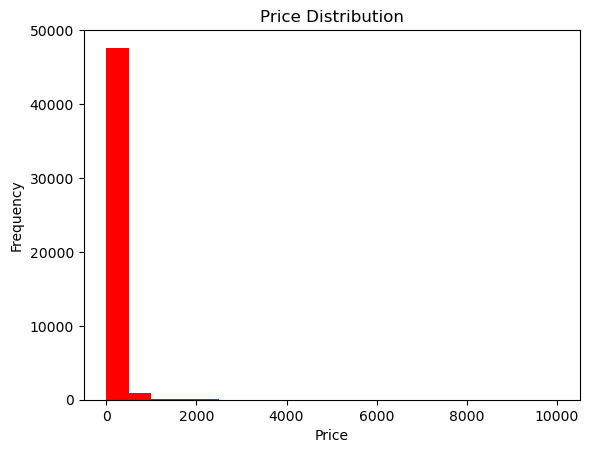

In [22]:
# Plot histogram of price variable
plt.hist(airbnb_data['price'], bins=20, color='Red')
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()


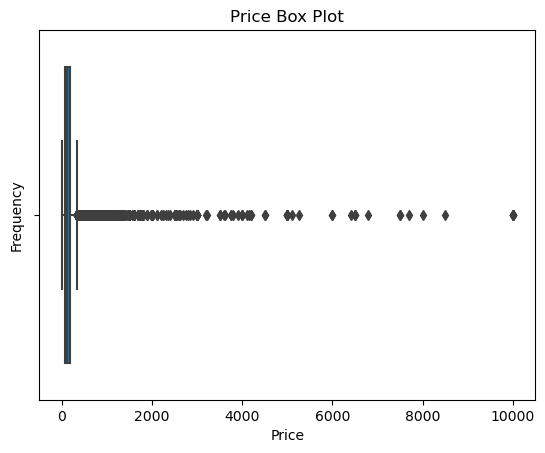

In [23]:
# Create a box plot of the price variable
sns.boxplot(x=airbnb_data['price'])
plt.title('Price Box Plot')
plt.xlabel('Price')
plt.ylabel('Frequency')

# Get the quartile values of the price variable
q1, q2, q3 = np.percentile(airbnb_data['price'], [25, 50, 75])

<Axes: >

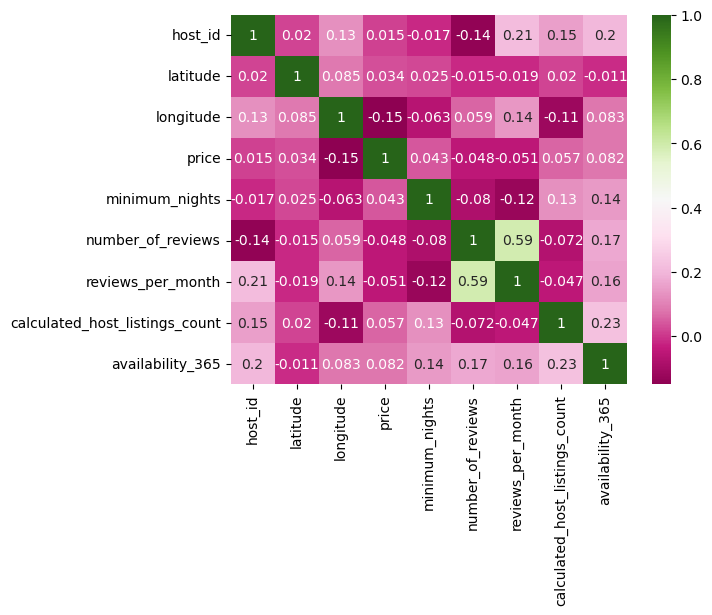

In [24]:
# Compute the correlation matrix
corr_matrix = airbnb_data.corr()

# Plot the correlation matrix as a heatmap
sns.heatmap(corr_matrix, annot=True, cmap='PiYG')

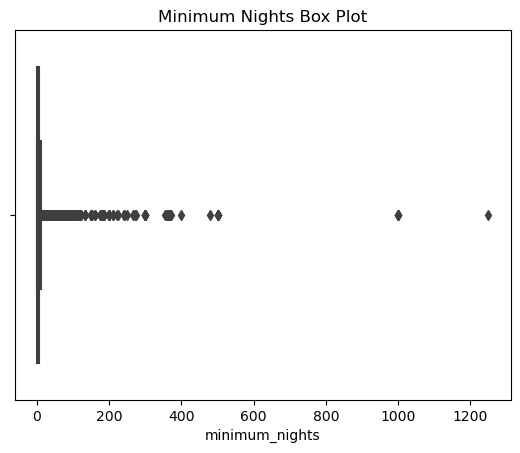

In [25]:
# Plot box plot of minimum_nights variable
sns.boxplot(x=airbnb_data['minimum_nights'])
plt.title('Minimum Nights Box Plot')
plt.show()

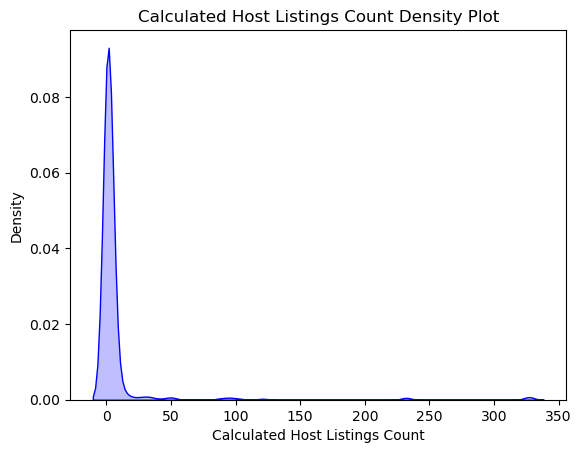

In [26]:
# Plot density plot of calculated_host_listings_count variable
sns.kdeplot(airbnb_data['calculated_host_listings_count'], shade=True, color="blue")
plt.title('Calculated Host Listings Count Density Plot')
plt.xlabel('Calculated Host Listings Count')
plt.ylabel('Density')
plt.show()

In [27]:
# Group the data by room type and calculate the mean price for each group
room_type_prices = airbnb_data.groupby("room_type")["price"].mean()


# Group the data by room type and calculate the mean price for each group
room_type_prices = airbnb_data.groupby("room_type")["price"].mean()


# Create a bar chart
fig = px.bar(x=room_type_prices.index, y=room_type_prices.values, color=room_type_prices.values, 
             color_continuous_scale="PiYG")

# Add axis labels and title
fig.update_xaxes(title="Room Type")
fig.update_yaxes(title="Mean Price")
fig.update_layout(title="Mean Price by Room Type")

# Show the plot
fig.show()

In [28]:
# Create a scatter plot between price and number_of_reviews
fig = px.scatter(airbnb_data, x="price", y="number_of_reviews", color="neighbourhood_group", title="Price vs. Number of Reviews",
                 labels={"price": "Price", "number_of_reviews": "Number of Reviews", "neighbourhood_group": "Neighbourhood Group"})

# Show the plot
fig.show()

In [29]:
airbnb_data['reviews_per_month'] = ['No' if s == '0' else 'Yes' for s in airbnb_data['reviews_per_month']]

airbnb_data.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.6475,-73.9724,Private room,149,1,9,Yes,6,365
1,2845,Manhattan,Midtown,40.7536,-73.9838,Entire home/apt,225,1,45,Yes,2,355
2,4632,Manhattan,Harlem,40.8090,-73.9419,Private room,150,3,0,Yes,1,365
3,4869,Brooklyn,Clinton Hill,40.6851,-73.9598,Entire home/apt,89,1,270,Yes,1,194
4,7192,Manhattan,East Harlem,40.7985,-73.9440,Entire home/apt,80,10,9,Yes,1,0


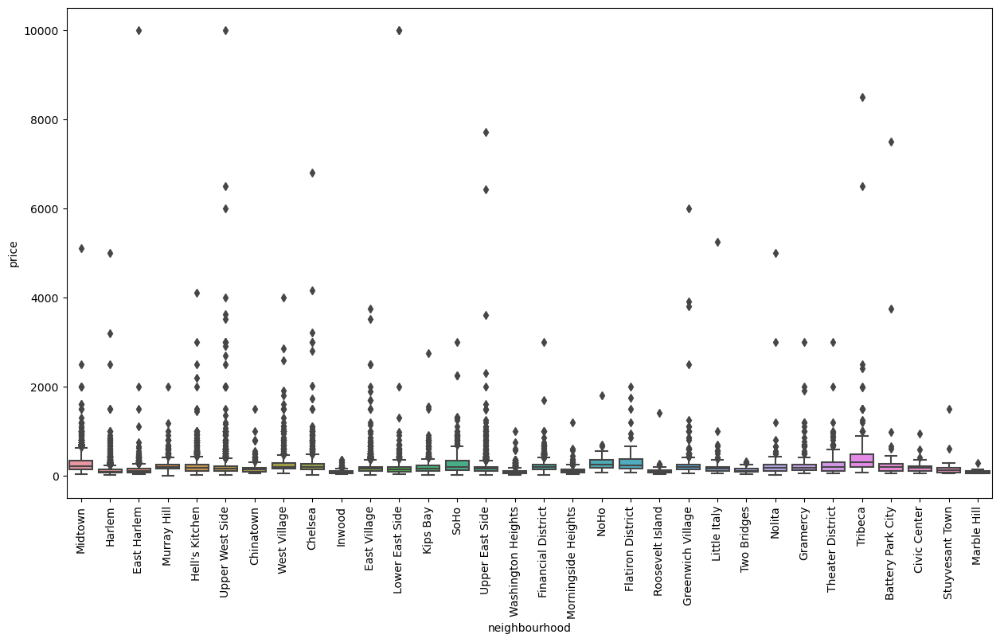

In [30]:
# Scatter plot for neighbourhood to check outliers in price
fig = plt.figure(figsize=(15, 8))
sns.boxplot(data=airbnb_data[airbnb_data['neighbourhood_group'] == 'Manhattan'], x='neighbourhood', y='price')
plt.xticks(rotation=90)
plt.show() 

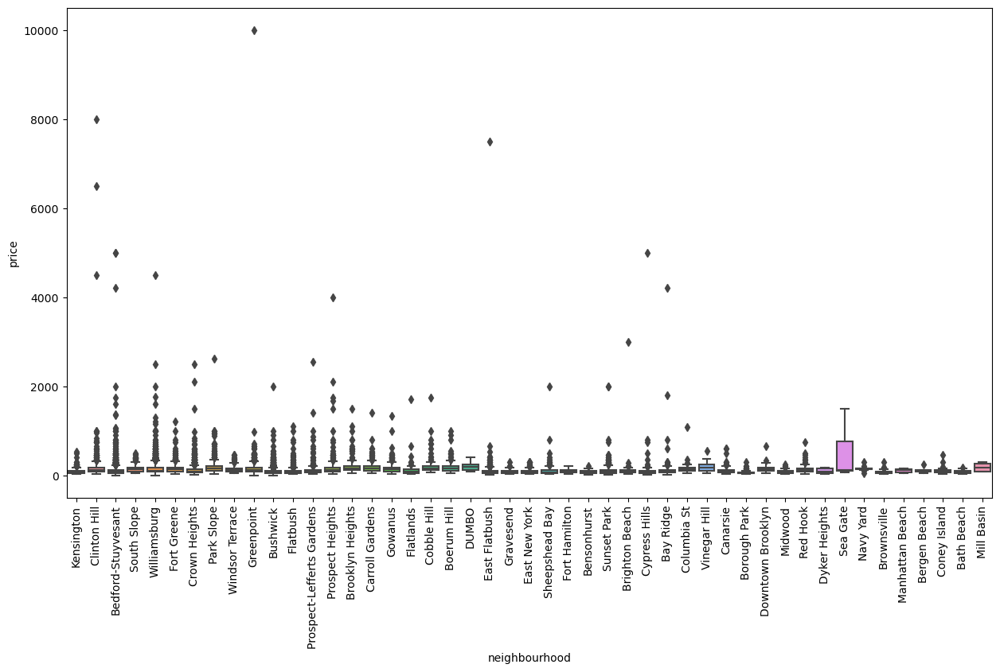

In [31]:
# Scatter plot for neighbourhood to check outliers in price
fig = plt.figure(figsize=(15, 8))
sns.boxplot(data=airbnb_data[airbnb_data['neighbourhood_group'] == 'Brooklyn'], x='neighbourhood', y='price')
plt.xticks(rotation=90)
plt.show() 

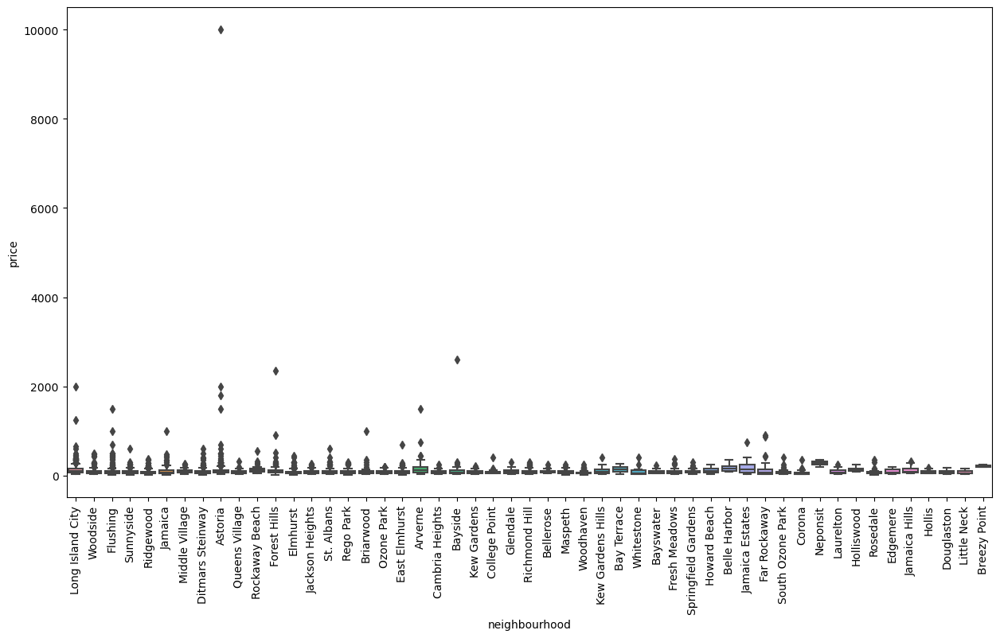

In [32]:
# Scatter plot for neighbourhood to check outliers in price
fig = plt.figure(figsize=(15, 8))
sns.boxplot(data=airbnb_data[airbnb_data['neighbourhood_group'] == 'Queens'], x='neighbourhood', y='price')
plt.xticks(rotation=90)
plt.show() 

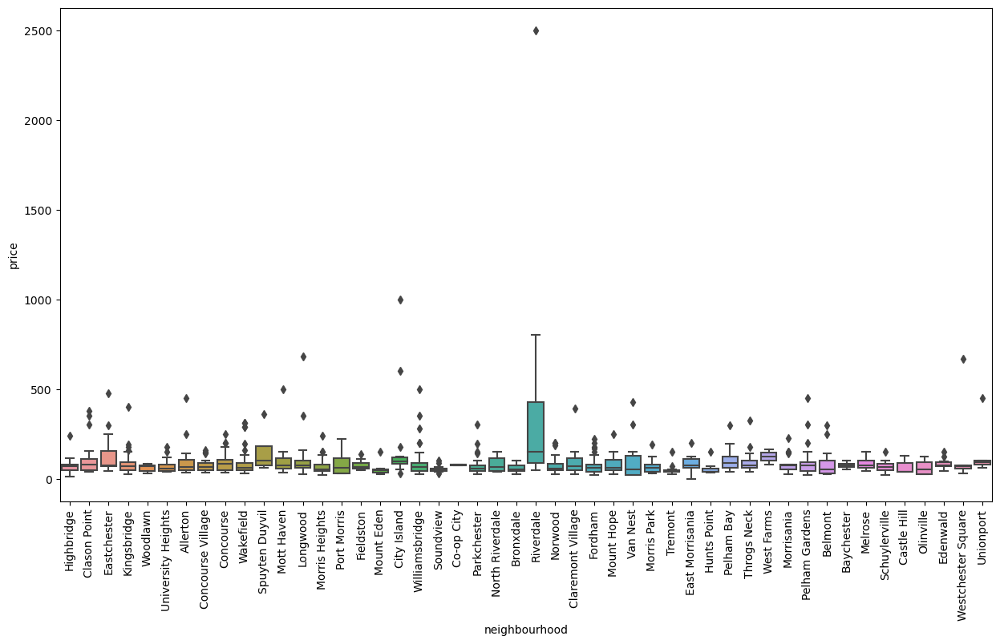

In [33]:
# Scatter plot for neighbourhood to check outliers in price
fig = plt.figure(figsize=(15, 8))
sns.boxplot(data=airbnb_data[airbnb_data['neighbourhood_group'] == 'Bronx'], x='neighbourhood', y='price')
plt.xticks(rotation=90)
plt.show() 

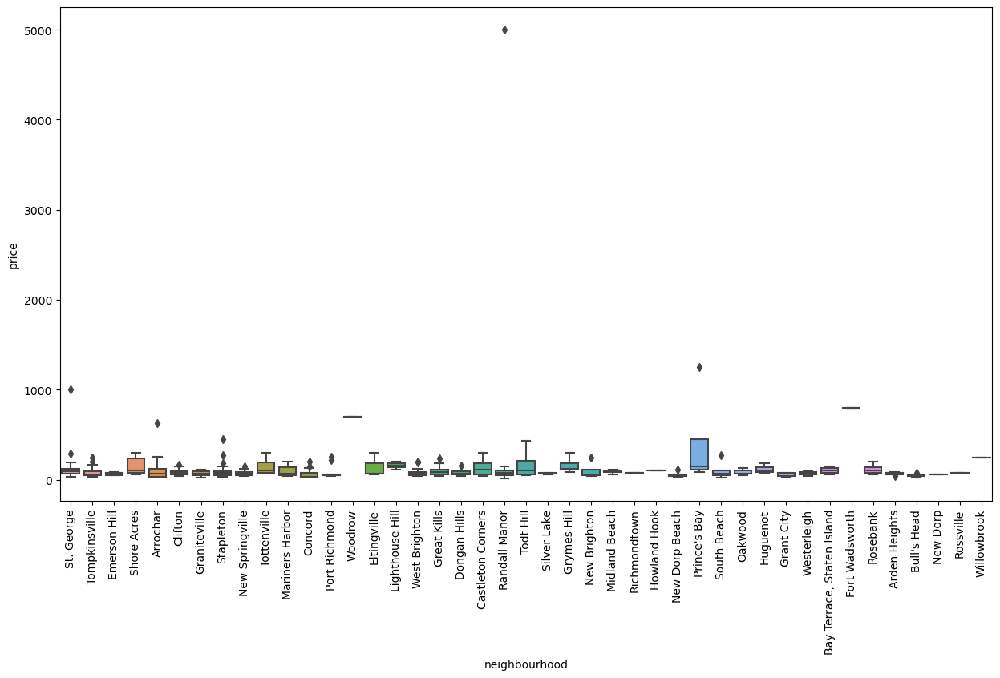

In [34]:
# Scatter plot for neighbourhood to check outliers in price
fig = plt.figure(figsize=(15, 8))
sns.boxplot(data=airbnb_data[airbnb_data['neighbourhood_group'] == 'Staten Island'], x='neighbourhood', y='price')
plt.xticks(rotation=90)
plt.show() 

In [35]:
# Select numerical features
numvar_airbnb = airbnb_data[['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365']]

# Select categorical features and drop non-feature columns
catevar_airbnb = airbnb_data.drop(['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365', 'price'], axis=1)

# Convert categorical features to numerical using LabelEncoder
encoder_label = LabelEncoder()
catevar_airbnb = catevar_airbnb.apply(encoder_label.fit_transform)

# Combine scaled numerical and categorical features
X = pd.concat([numvar_airbnb, catevar_airbnb], axis=1)
y = airbnb_data['price']

In [36]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X.drop(["host_id", "latitude", "longitude"], axis = 1), y, test_size=0.2, random_state=42)
X_train

,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,neighbourhood_group,neighbourhood,room_type,reviews_per_month
32645,3,11,1,1,1,214,0,0
23615,2,2,1,0,2,206,1,0
31183,2,0,2,0,1,13,1,0
29260,3,87,1,267,1,13,0,0
7275,5,13,1,0,3,220,1,0
...,...,...,...,...,...,...,...,...
11284,1,0,1,0,2,206,2,0
44732,2,4,1,76,2,34,1,0
38158,30,1,5,261,2,202,0,0
860,2,11,1,2,2,202,0,0


In [37]:
stdscaler = StandardScaler()

X_train[['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365']] = stdscaler.fit_transform(X_train[['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365']])
X_test[['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365']] = stdscaler.transform(X_test[['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365']])
X_train

,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,neighbourhood_group,neighbourhood,room_type,reviews_per_month
32645,-0.1930,-0.2772,-0.1866,-0.8529,1,214,0,0
23615,-0.2396,-0.4795,-0.1866,-0.8604,2,206,1,0
31183,-0.2396,-0.5244,-0.1564,-0.8604,1,13,1,0
29260,-0.1930,1.4307,-0.1866,1.1647,1,13,0,0
7275,-0.0999,-0.2323,-0.1866,-0.8604,3,220,1,0
...,...,...,...,...,...,...,...,...
11284,-0.2862,-0.5244,-0.1866,-0.8604,2,206,2,0
44732,-0.2396,-0.4345,-0.1866,-0.2840,2,34,1,0
38158,1.0644,-0.5019,-0.0660,1.1192,2,202,0,0
860,-0.2396,-0.2772,-0.1866,-0.8453,2,202,0,0


## <a id='4'>Decision Tree Model</a>

In [38]:
# Initialize the decision tree model
decisiontree_airbnb = DecisionTreeRegressor(random_state=42)

# Train the model on the training set
decisiontree_airbnb.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = decisiontree_airbnb.predict(X_test)

# Calculate the mean squared error of the predictions
mse_airbnbdecisiontree = mean_squared_error(y_test, y_pred)
rmse_airbnbdecisiontree = sqrt(mse_airbnbdecisiontree)

print("Decision Tree Mean Squared Error:", mse_airbnbdecisiontree)
print("Decision Tree Root Mean Squared Error:", rmse_airbnbdecisiontree)

# Checking accuracy of decision tree
accuracy_decisiontree_airbnb = decisiontree_airbnb.score(X_test, y_test)
print(f"Decision Tree Accuracy: {accuracy_decisiontree_airbnb}")

Decision Tree Mean Squared Error: 124969.37276043833
Decision Tree Root Mean Squared Error: 353.51007448223925
Decision Tree Accuracy: -1.8249175069854249


## <a id='4'>Random Forest Model</a>

In [39]:
# Initialize the Random Forest model
randomforest_airbnb = RandomForestRegressor(random_state=42)

# Train the model on the training set
randomforest_airbnb.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = randomforest_airbnb.predict(X_test)

# Calculate the mean squared error of the predictions
mse_airbnbrandomfrst = mean_squared_error(y_test, y_pred)
rmse_airbnbrandomfrst = sqrt(mse_airbnbrandomfrst)

print("Random Forest Mean Squared Error:", mse_airbnbrandomfrst)
print("Random Forest Root Mean Squared Error:", rmse_airbnbrandomfrst)

# Checking accuracy of decision tree
accuracy_randforst_airbnb = randomforest_airbnb.score(X_test, y_test)
print(f"Random Forest Accuracy: {accuracy_randforst_airbnb}")

Random Forest Mean Squared Error: 42156.79802080815
Random Forest Root Mean Squared Error: 205.3212069436768
Random Forest Accuracy: 0.04705069620762525


## <a id='4'>GBM Model</a>

In [40]:
# Initialize the GBM model with default hyperparameters
gbm_airbnb = GradientBoostingRegressor(random_state=42)

# Train the model on the training set
gbm_airbnb.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = gbm_airbnb.predict(X_test)

# Calculate the mean squared error of the predictions
mse_airbnbgbm = mean_squared_error(y_test, y_pred)
rmse_airbnbgbm = sqrt(mse_airbnbgbm)

print("GBM Mean Squared Error:", mse_airbnbgbm)
print("GBM Root Mean Squared Error:",rmse_airbnbgbm)

# Checking accuracy of GBM
accuracy_gbm_airbnb = gbm_airbnb.score(X_test, y_test)
print(f"GBM Accuracy: {accuracy_gbm_airbnb}")


GBM Mean Squared Error: 37391.34652855605
GBM Root Mean Squared Error: 193.36842174604428
GBM Accuracy: 0.15477314893177352


In [41]:
# GBM Hypertuning

model = []
alphas = []
rmse = []
accuracy = []

for alpha in np.arange(0, 10, 0.1):
    gbm_model = GradientBoostingRegressor(learning_rate = alpha, verbose=0, random_state=42)
    gbm_model.fit(X_train, y_train)
    model.append(gbm_model)
    alphas.append(alpha)
    # Get predictions on test data
    test_preds = gbm_model.predict(X_test)

    rmse.append(mean_squared_error(y_test, test_preds, squared=False))
    accuracy.append(gbm_model.score(X_test, y_test))
data_df = pd.DataFrame({ "Alpha": alphas, 
                        "model": model, 
                        "RMSE": rmse, 
                        "Accuracy": accuracy
})
data_df

,Alpha,model,RMSE,Accuracy
0,0.0000,([DecisionTreeRegressor(criterion='friedman_ms...,210.3920,-0.0006
1,0.1000,([DecisionTreeRegressor(criterion='friedman_ms...,193.3684,0.1548
2,0.2000,([DecisionTreeRegressor(criterion='friedman_ms...,192.8364,0.1594
3,0.3000,([DecisionTreeRegressor(criterion='friedman_ms...,192.0019,0.1667
4,0.4000,([DecisionTreeRegressor(criterion='friedman_ms...,190.6790,0.1781
...,...,...,...,...
95,9.5000,([DecisionTreeRegressor(criterion='friedman_ms...,62849332882186583295578088925549308140120740304...,-8929014422877039813123827883192434662924762818...
96,9.6000,([DecisionTreeRegressor(criterion='friedman_ms...,20241663516284180314033710379696662231629176742...,-9261782594195632506838814282620850380835250043...
97,9.7000,([DecisionTreeRegressor(criterion='friedman_ms...,64316067070001172984198460696608862728548900152...,-9350635736052051105287564800201276696472774589...
98,9.8000,([DecisionTreeRegressor(criterion='friedman_ms...,20167623836166144193773256899634774115124289245...,-9194151267757775547638789964157007925130976832...


<Axes: xlabel='Alpha', ylabel='RMSE'>

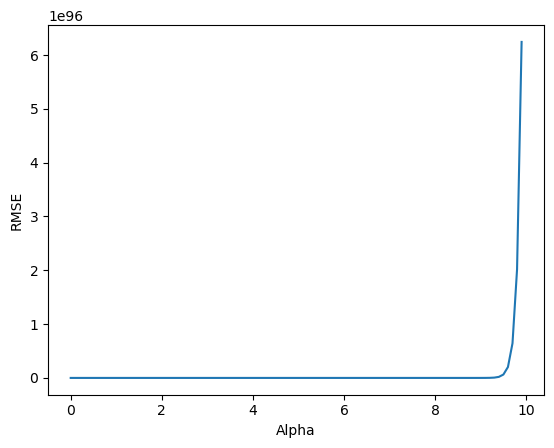

In [42]:
sns.lineplot(data_df, x = 'Alpha', y = "RMSE")

<Axes: xlabel='Alpha', ylabel='Accuracy'>

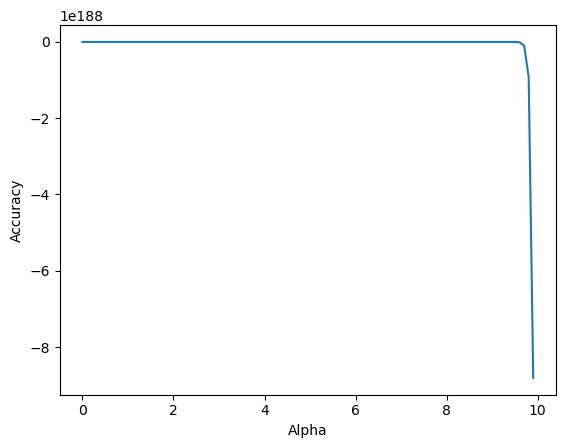

In [43]:
sns.lineplot(data_df, x = 'Alpha', y = "Accuracy")

## <a id='4'>XgBoost Model</a>

In [44]:
# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Train the model on the training set
xgb_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = xgb_model.predict(X_test)

# Calculate the mean squared error of the predictions
mse_xgb = mean_squared_error(y_test, y_pred)
rmse_xgb = sqrt(mse_xgb)

print("XGBoost Mean Squared Error:", mse_xgb)
print("XGBoost Root Mean Squared Error:", rmse_xgb)

# Checking accuracy of XGBoost
accuracy_xgb = xgb_model.score(X_test, y_test)
print(f"XGBoost Accuracy: {accuracy_xgb}")

XGBoost Mean Squared Error: 37573.483839183275
XGBoost Root Mean Squared Error: 193.83880890880255
XGBoost Accuracy: 0.15065595712628677


In [45]:
# Xg Boost (Lasso)

model = []
alphas = []
rmse = []
accuracy = []

for alpha in np.arange(0.0, 10, 0.1):
    #L1 regularization term on weights. Increasing this value will make model more conservative.
    xgb_model = xgb.XGBRegressor(reg_alpha = alpha, verbosity=0, random_state=42)
    xgb_model.fit(X_train, y_train)
    model.append(xgb_model)
    alphas.append(alpha)
# Get predictions on test data
    test_preds = xgb_model.predict(X_test)
    rmse.append(mean_squared_error(y_test, test_preds, squared=False))
    accuracy.append(xgb_model.score(X_test, y_test))
data_df = pd.DataFrame({ "Alpha": alphas,
                        "model": model,
                        "RMSE": rmse,
                        "Accuracy": accuracy
})
data_df

,Alpha,model,RMSE,Accuracy
0,0.0000,"XGBRegressor(base_score=None, booster=None, ca...",193.8388,0.1507
1,0.1000,"XGBRegressor(base_score=None, booster=None, ca...",193.6609,0.1522
2,0.2000,"XGBRegressor(base_score=None, booster=None, ca...",194.2527,0.1470
3,0.3000,"XGBRegressor(base_score=None, booster=None, ca...",194.2521,0.1470
4,0.4000,"XGBRegressor(base_score=None, booster=None, ca...",193.5978,0.1528
...,...,...,...,...
95,9.5000,"XGBRegressor(base_score=None, booster=None, ca...",192.8199,0.1596
96,9.6000,"XGBRegressor(base_score=None, booster=None, ca...",192.8194,0.1596
97,9.7000,"XGBRegressor(base_score=None, booster=None, ca...",192.8189,0.1596
98,9.8000,"XGBRegressor(base_score=None, booster=None, ca...",192.2069,0.1649


<Axes: xlabel='Alpha', ylabel='RMSE'>

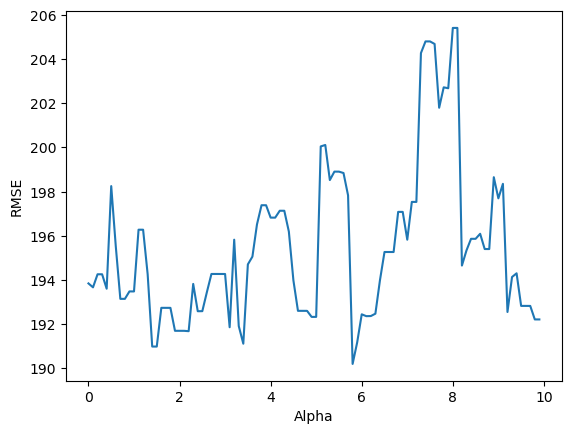

In [46]:
sns.lineplot(data_df, x = 'Alpha', y = "RMSE")

<Axes: xlabel='Alpha', ylabel='Accuracy'>

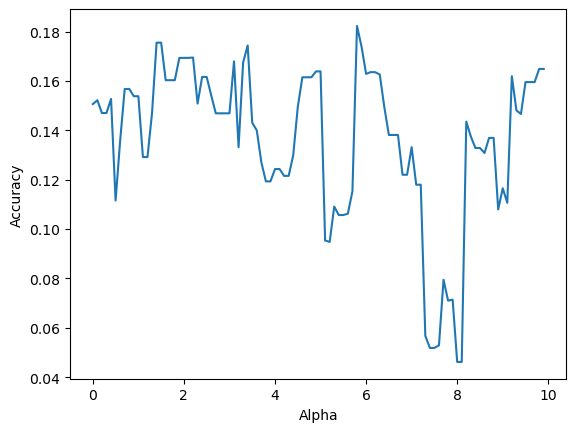

In [47]:
sns.lineplot(data_df, x = 'Alpha', y = "Accuracy")

In [48]:
# Xg Boost(Ridge)
model = []
alphas = []
rmse = []
accuracy = []

for alpha in np.arange(0.0, 10, 0.1):
    #L2 regularization term on weights. Increasing this value will make model more conservative.
    xgb_model = xgb.XGBRegressor(reg_lambda = alpha, verbosity=0, random_state=42)
    xgb_model.fit(X_train, y_train)
    model.append(xgb_model)
    alphas.append(alpha)
# Get predictions on test data
    test_preds = xgb_model.predict(X_test)
    rmse.append(mean_squared_error(y_test, test_preds, squared=False))
    accuracy.append(xgb_model.score(X_test, y_test))
data_df = pd.DataFrame({ "Alpha": alphas,
                        "model": model,
                        "RMSE": rmse,
                        "Accuracy": accuracy
})
data_df

,Alpha,model,RMSE,Accuracy
0,0.0000,"XGBRegressor(base_score=None, booster=None, ca...",195.8181,0.1332
1,0.1000,"XGBRegressor(base_score=None, booster=None, ca...",205.3579,0.0467
2,0.2000,"XGBRegressor(base_score=None, booster=None, ca...",206.1414,0.0394
3,0.3000,"XGBRegressor(base_score=None, booster=None, ca...",196.0507,0.1312
4,0.4000,"XGBRegressor(base_score=None, booster=None, ca...",199.4083,0.1011
...,...,...,...,...
95,9.5000,"XGBRegressor(base_score=None, booster=None, ca...",213.0895,-0.0264
96,9.6000,"XGBRegressor(base_score=None, booster=None, ca...",211.5716,-0.0119
97,9.7000,"XGBRegressor(base_score=None, booster=None, ca...",210.1514,0.0017
98,9.8000,"XGBRegressor(base_score=None, booster=None, ca...",208.8769,0.0138


<Axes: xlabel='Alpha', ylabel='RMSE'>

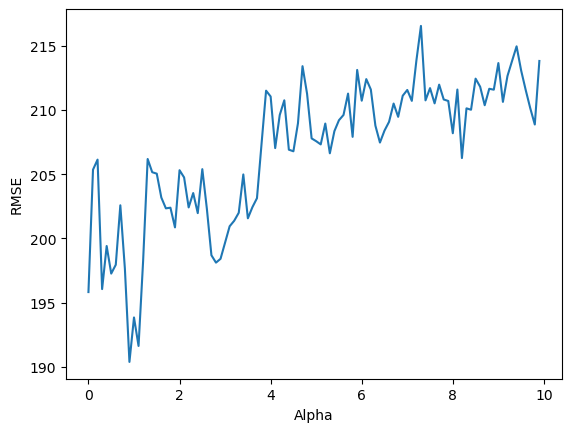

In [49]:
sns.lineplot(data_df, x = 'Alpha', y = "RMSE")

<Axes: xlabel='Alpha', ylabel='Accuracy'>

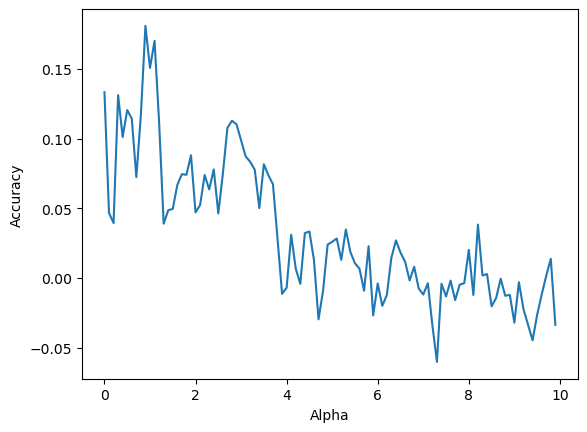

In [50]:
sns.lineplot(data_df, x = 'Alpha', y = "Accuracy")

## <a id='4'>CatBoost Model</a>

In [51]:
# Initialize the CatBoost model
catboost_airbnb = CatBoostRegressor(random_state=42)

# Train the model on the training set
catboost_airbnb.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = catboost_airbnb.predict(X_test)

# Calculate the mean squared error of the predictions
mse_airbnbcatboost = mean_squared_error(y_test, y_pred)
rmse_airbnbcatboost = sqrt(mse_airbnbcatboost)

print("CatBoost Mean Squared Error:", mse_airbnbcatboost)
print("CatBoost Root Mean Squared Error:", rmse_airbnbcatboost)

# Checking accuracy of CatBoost
accuracy_catboost_airbnb = catboost_airbnb.score(X_test, y_test)
print(f"CatBoost Accuracy: {accuracy_catboost_airbnb}")

Learning rate set to 0.073075
0:	learn: 245.0671169	total: 151ms	remaining: 2m 30s
1:	learn: 243.2799495	total: 163ms	remaining: 1m 21s
2:	learn: 241.7022961	total: 173ms	remaining: 57.5s
3:	learn: 240.2448410	total: 184ms	remaining: 45.9s
4:	learn: 238.8031894	total: 195ms	remaining: 38.7s
5:	learn: 237.6962618	total: 204ms	remaining: 33.8s
6:	learn: 236.4798438	total: 215ms	remaining: 30.5s
7:	learn: 235.1509985	total: 226ms	remaining: 28s
8:	learn: 234.2090044	total: 239ms	remaining: 26.3s
9:	learn: 233.3912790	total: 250ms	remaining: 24.8s
10:	learn: 232.5969235	total: 264ms	remaining: 23.7s
11:	learn: 231.6686978	total: 275ms	remaining: 22.7s
12:	learn: 230.6616933	total: 287ms	remaining: 21.8s
13:	learn: 229.9747630	total: 297ms	remaining: 20.9s
14:	learn: 229.4295599	total: 309ms	remaining: 20.3s
15:	learn: 228.8946756	total: 320ms	remaining: 19.7s
16:	learn: 228.1993758	total: 331ms	remaining: 19.1s
17:	learn: 227.7277245	total: 342ms	remaining: 18.6s
18:	learn: 227.1394846	tot

In [52]:
# CatBoost Ridge regularization

model = []
alphas = []
rmse = []
accuracy = []

for alpha in np.arange(0.0, 10, 0.1):
    # Ridge regularization
    catboost_model_ridge = CatBoostRegressor(l2_leaf_reg= alpha, verbose = 0)
    catboost_model_ridge.fit(X_train, y_train)
    model.append(catboost_model_ridge)
    alphas.append(alpha)
    # Get predictions on test data
    test_preds = catboost_model_ridge.predict(X_test)
    rmse.append(mean_squared_error(y_test, test_preds, squared=False))
    accuracy.append(catboost_model_ridge.score(X_test, y_test))
data_df = pd.DataFrame({ "Alpha": alphas,
                        "model": model,
                        "RMSE": rmse,
                        "Accuracy": accuracy
})
data_df

,Alpha,model,RMSE,Accuracy
0,0.0000,<catboost.core.CatBoostRegressor object at 0x0...,185.8407,0.2193
1,0.1000,<catboost.core.CatBoostRegressor object at 0x0...,185.6331,0.2210
2,0.2000,<catboost.core.CatBoostRegressor object at 0x0...,187.2393,0.2075
3,0.3000,<catboost.core.CatBoostRegressor object at 0x0...,185.6724,0.2207
4,0.4000,<catboost.core.CatBoostRegressor object at 0x0...,186.6542,0.2125
...,...,...,...,...
95,9.5000,<catboost.core.CatBoostRegressor object at 0x0...,186.8875,0.2105
96,9.6000,<catboost.core.CatBoostRegressor object at 0x0...,187.3273,0.2068
97,9.7000,<catboost.core.CatBoostRegressor object at 0x0...,187.2316,0.2076
98,9.8000,<catboost.core.CatBoostRegressor object at 0x0...,186.8494,0.2108


<Axes: xlabel='Alpha', ylabel='RMSE'>

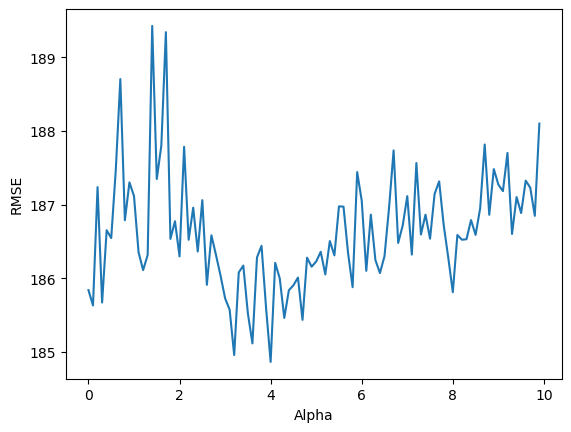

In [53]:
sns.lineplot(data_df, x = 'Alpha', y = "RMSE")

<Axes: xlabel='Alpha', ylabel='Accuracy'>

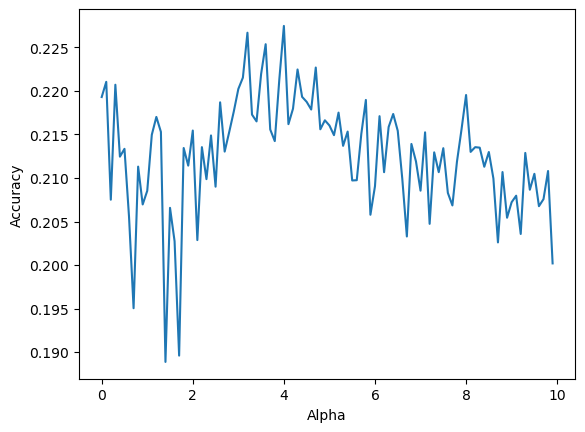

In [54]:
sns.lineplot(data_df, x = 'Alpha', y = "Accuracy")

## <a id='4'>LightGBM Model</a>

In [55]:
# Initialize the LightGBM model
lgb_model = lgb.LGBMRegressor(random_state=42)

# Train the model on the training set
lgb_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = lgb_model.predict(X_test)

# Calculate the mean squared error of the predictions
mse_lgb = mean_squared_error(y_test, y_pred)
rmse_lgb = sqrt(mse_lgb)

print("LightGBM Mean Squared Error:", mse_lgb)
print("LightGBM Root Mean Squared Error:", rmse_lgb)

# Checking accuracy of LightGBM
accuracy_lgb = lgb_model.score(X_test, y_test)
print(f"LightGBM Accuracy: {accuracy_lgb}")

LightGBM Mean Squared Error: 37093.883559105365
LightGBM Root Mean Squared Error: 192.59772469867178
LightGBM Accuracy: 0.16149726326090552


In [56]:
# LightGBM Ridge Regularization

model = []
alphas = []
rmse = []
accuracy = []

for alpha in np.arange(0.0, 10, 0.1):
    #l2
    lgb_model = lgb.LGBMRegressor(reg_lambda = alpha, verbose = 0, force_row_wise=True)
    lgb_model.fit(X_train, y_train)
    model.append(lgb_model)
    alphas.append(alpha)

    # Get predictions on test data
    test_preds = lgb_model.predict(X_test)

    rmse.append(mean_squared_error(y_test, test_preds, squared=False))
    accuracy.append(lgb_model.score(X_test, y_test))

data_df = pd.DataFrame({ "Alpha": alphas, 
                        "model": model, 
                        "RMSE": rmse, 
                        "Accuracy": accuracy
})
data_df

,Alpha,model,RMSE,Accuracy
0,0.0000,"LGBMRegressor(force_row_wise=True, verbose=0)",192.5977,0.1615
1,0.1000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",192.5042,0.1623
2,0.2000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",192.7231,0.1604
3,0.3000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",192.5494,0.1619
4,0.4000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",192.6219,0.1613
...,...,...,...,...
95,9.5000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",190.5293,0.1794
96,9.6000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",190.9523,0.1758
97,9.7000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",190.7323,0.1777
98,9.8000,"LGBMRegressor(force_row_wise=True, reg_lambda=...",191.2595,0.1731


<Axes: xlabel='Alpha', ylabel='RMSE'>

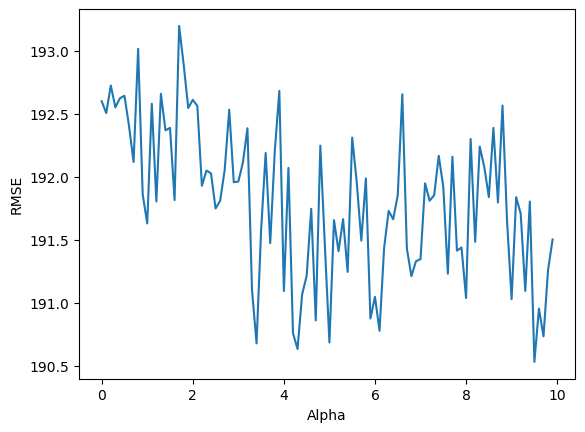

In [57]:
sns.lineplot(data_df, x = 'Alpha', y = "RMSE")

<Axes: xlabel='Alpha', ylabel='Accuracy'>

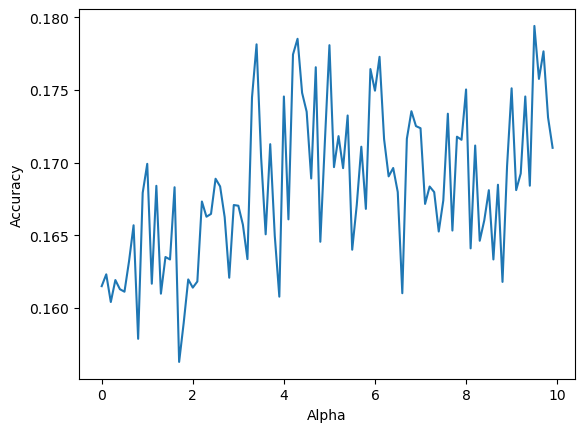

In [58]:
sns.lineplot(data_df, x = 'Alpha', y = "Accuracy")

In [59]:
# lightGBM (Lasso)
model = []
alphas = []
rmse = []
accuracy = []

for alpha in np.arange(0.0, 10, 0.1):
    #l1 regularization
    lgb_model = lgb.LGBMRegressor(reg_alpha = alpha, verbose = 0, force_row_wise=True)
    lgb_model.fit(X_train, y_train)
    model.append(lgb_model)
    alphas.append(alpha)

    # Get predictions on test data
    test_preds = lgb_model.predict(X_test)

    rmse.append(mean_squared_error(y_test, test_preds, squared=False))
    accuracy.append(lgb_model.score(X_test, y_test))

data_df = pd.DataFrame({ "Alpha": alphas, 
                        "model": model, 
                        "RMSE": rmse, 
                        "Accuracy": accuracy
})
data_df

,Alpha,model,RMSE,Accuracy
0,0.0000,"LGBMRegressor(force_row_wise=True, verbose=0)",192.5977,0.1615
1,0.1000,"LGBMRegressor(force_row_wise=True, reg_alpha=0...",192.8332,0.1594
2,0.2000,"LGBMRegressor(force_row_wise=True, reg_alpha=0...",192.8838,0.1590
3,0.3000,"LGBMRegressor(force_row_wise=True, reg_alpha=0...",191.9421,0.1672
4,0.4000,"LGBMRegressor(force_row_wise=True, reg_alpha=0...",191.2978,0.1728
...,...,...,...,...
95,9.5000,"LGBMRegressor(force_row_wise=True, reg_alpha=9...",192.0850,0.1660
96,9.6000,"LGBMRegressor(force_row_wise=True, reg_alpha=9...",192.0849,0.1660
97,9.7000,"LGBMRegressor(force_row_wise=True, reg_alpha=9...",192.0849,0.1660
98,9.8000,"LGBMRegressor(force_row_wise=True, reg_alpha=9...",192.0849,0.1660


<Axes: xlabel='Alpha', ylabel='RMSE'>

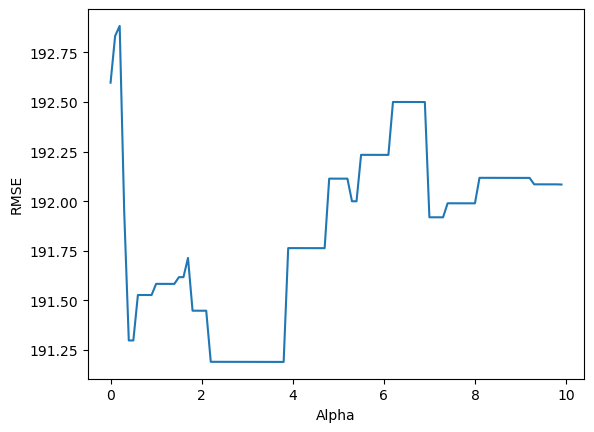

In [60]:
sns.lineplot(data_df, x = 'Alpha', y = "RMSE")

<Axes: xlabel='Alpha', ylabel='Accuracy'>

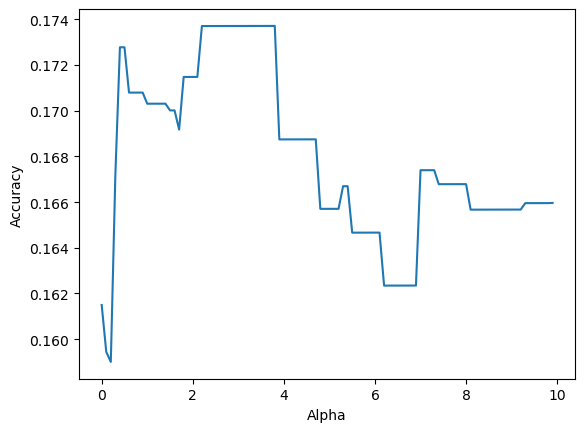

In [61]:
sns.lineplot(data_df, x = 'Alpha', y = "Accuracy")

In [62]:
import pandas as pd

# Create a dictionary to store the model accuracies
model_dict = {
    'Model': ['Decision Tree', 'Random Forest', 'GBM', 'XGBoost', 'CatBoost', 'LightGBM'],
    'Accuracy': [accuracy_decisiontree_airbnb, accuracy_randforst_airbnb, accuracy_gbm_airbnb, accuracy_xgb, accuracy_catboost_airbnb, accuracy_lgb]
}

# Create a dataframe from the dictionary
df = pd.DataFrame(model_dict)

# Sort the dataframe by accuracy in descending order
df = df.sort_values('Accuracy', ascending=False)

# Print the dataframe
print(df)

           Model  Accuracy
4       CatBoost    0.2072
5       LightGBM    0.1615
2            GBM    0.1548
3        XGBoost    0.1507
1  Random Forest    0.0471
0  Decision Tree   -1.8249


#### The best model is the one with the highest accuracy. In this case, the CatBoost model has the highest accuracy of 0.2072, followed by the LightGBM model with an accuracy of 0.1615, the GBM model with an accuracy of 0.1548, the XGBoost model with an accuracy of 0.1507, the Random Forest model with an accuracy of 0.0471, and the Decision Tree model with an accuracy of -1.8249.

In [63]:
import pandas as pd

# Create a dictionary to store the model accuracies
model_dict = {'Model': ['Decision Tree', 'Random Forest', 'GBM', 'XGBoost', 'CatBoost', 'LightGBM'],
    'RMSE': [rmse_airbnbdecisiontree, rmse_airbnbrandomfrst, rmse_airbnbgbm, rmse_xgb, rmse_airbnbcatboost, rmse_lgb]}

# Create a dataframe from the dictionary
df_rmse = pd.DataFrame(model_dict)

# Print the dataframe
print(df_rmse)

           Model     RMSE
0  Decision Tree 353.5101
1  Random Forest 205.3212
2            GBM 193.3684
3        XGBoost 193.8388
4       CatBoost 187.2708
5       LightGBM 192.5977


#### Based on the RMSE values reported for each model, it appears that CatBoost has the lowest RMSE (187.2708), followed closely by GBM, XGBoost, and LightGBM, while Random Forest has a higher RMSE of 205.3212, and Decision Tree has the highest RMSE of 353.5101. Lower RMSE values generally indicate that the model is better at predicting the target variable on unseen data. 

In [64]:
# Lasso Regularization for train dataset
lasso_ai = LassoCV(alphas = None, cv = 10, max_iter = 100000)
lasso_ai.fit(X_train, y_train)

LassoCV(cv=10, max_iter=100000)

In [65]:
# best alpha parameter
alpha = lasso_ai.alpha_
alpha

1.0438027719325857

In [66]:
lasso = Lasso(alpha = lasso_ai.alpha_)
lasso.fit(X_train, y_train)

Lasso(alpha=1.0438027719325857)

In [67]:
lasso.coef_

array([1.126179, -14.177661, 0.000000, 22.420755, 7.605124, 0.152857,
       -105.181784, 0.000000])

In [68]:
X_train.columns

Index(['minimum_nights', 'number_of_reviews', 'calculated_host_listings_count',
       'availability_365', 'neighbourhood_group', 'neighbourhood', 'room_type',
       'reviews_per_month'],
      dtype='object')

In [69]:
lasso.score(X_train, y_train)

0.07264462836624741

In [70]:
lasso.score(X_test, y_test)

0.09747628934073416

In [71]:
# Ridge Model
alphas = np.random.uniform(0, 10, 50)
ridge_ai = RidgeCV(alphas = alphas, cv = 10)
ridge_ai.fit(X_train, y_train)


RidgeCV(alphas=array([6.530914, 4.047625, 3.613167, 9.380799, 9.753487, 5.697121,
       5.157751, 6.804684, 7.729353, 7.252369, 8.223708, 6.795713,
       4.870054, 7.586845, 7.263090, 5.547132, 9.890054, 8.885932,
       8.097287, 8.514804, 3.367051, 8.974062, 6.505066, 3.737754,
       6.173057, 0.212348, 8.196787, 7.822434, 5.095167, 6.420450,
       8.984492, 0.164457, 5.386677, 9.885855, 9.957216, 6.048981,
       6.694496, 3.254042, 4.638026, 5.778753, 7.931146, 4.996786,
       9.083580, 5.312398, 2.410226, 8.385987, 3.076665, 8.091727,
       9.529839, 0.776086]),
        cv=10)

In [72]:
# best alpha parameter
alpha = ridge_ai.alpha_
alpha

9.957215813790029

In [73]:
ridge = Ridge(alpha = ridge_ai.alpha_)
ridge.fit(X_train, y_train)

Ridge(alpha=9.957215813790029)

In [74]:
ridge.coef_

array([1.780123, -15.348618, 0.124224, 23.469121, 9.405459, 0.148584,
       -108.528131, 0.000000])

In [75]:
ridge.score(X_train, y_train)

0.07278515756595694

In [76]:
ridge.score(X_test, y_test)

0.09738614908978738

## <a id='4'>END OF ANALYSIS</a>